In [1]:
import os, sys
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from skimage import io, color
from skimage.transform import *
import seaborn as sns
sns.set()

import keras

from config import dataset_conf
from nn import ImageColorizer
from data import DataGenerator, build_dataset, load_dataset

Using TensorFlow backend.


In [2]:
dataset = "short_SUN2012"
weights = "weight-short_SUN2012-270-0.0031.hdf5"
colorizer = ImageColorizer(dataset_name = dataset)
colorizer.load_weights("weights/"+weights)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              (None, 224, 224, 1)  0                                            
__________________________________________________________________________________________________
global_features_extractor (Mode [(None, 256), (None, 38195072    Input[0][0]                      
__________________________________________________________________________________________________
dense_cl_1 (Dense)              (None, 256)          131328      global_features_extractor[1][1]  
__________________________________________________________________________________________________
mid_features_extractor (Model)  multiple             3542784     global_features_extractor[1][2]  
__________________________________________________________________________________________________
dropout_1 

In [3]:
train_set, val_set = load_dataset(dataset)

In [8]:
validation_generator = DataGenerator(train_set, training = False)

In [9]:
batch_imgs, batch_labels = validation_generator.__getitem__(0)

predicted, pred_labels = colorizer.nn.predict(batch_imgs)
lab_image = np.concatenate([batch_imgs*100,predicted*255-128], axis=3)
lab_image_true = np.concatenate([batch_imgs*100,batch_labels[0]*255-128], axis=3)

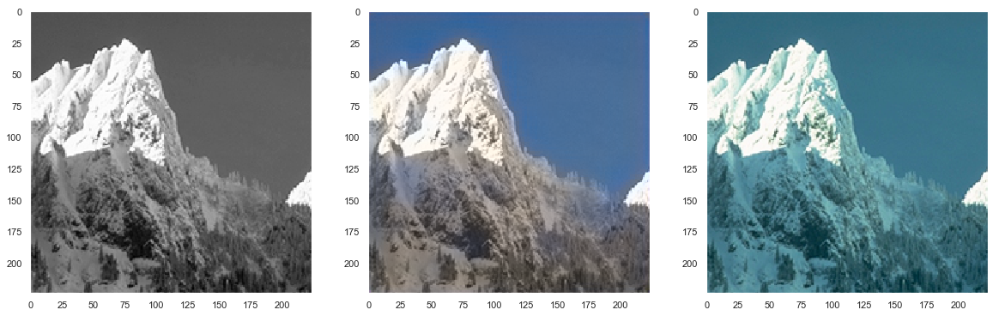

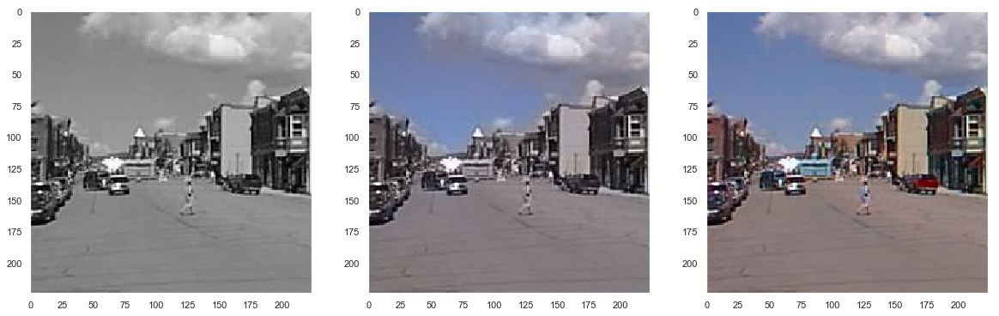

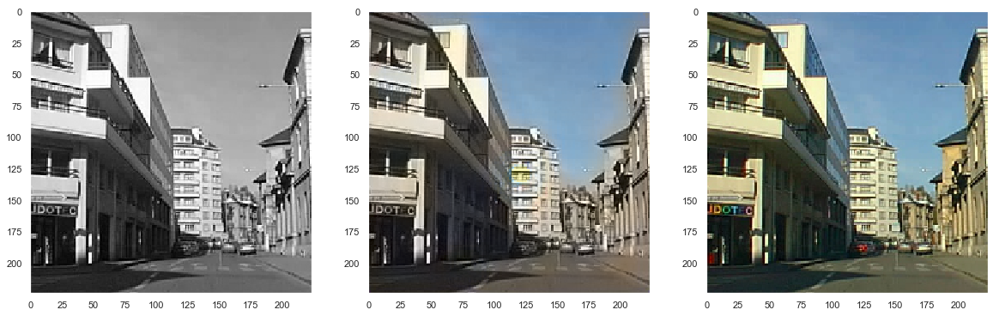

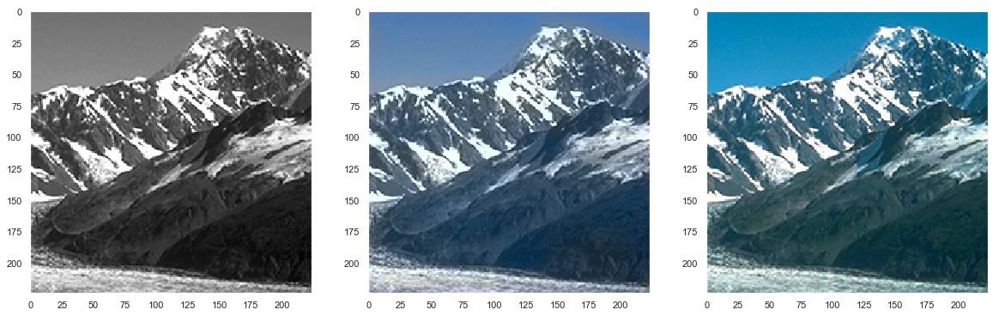

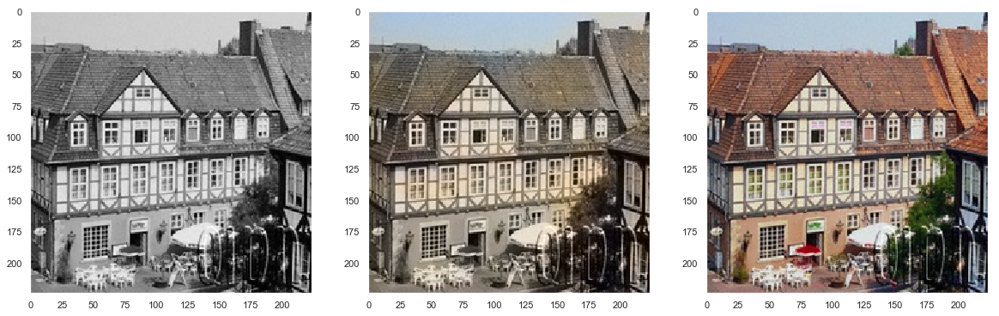

...

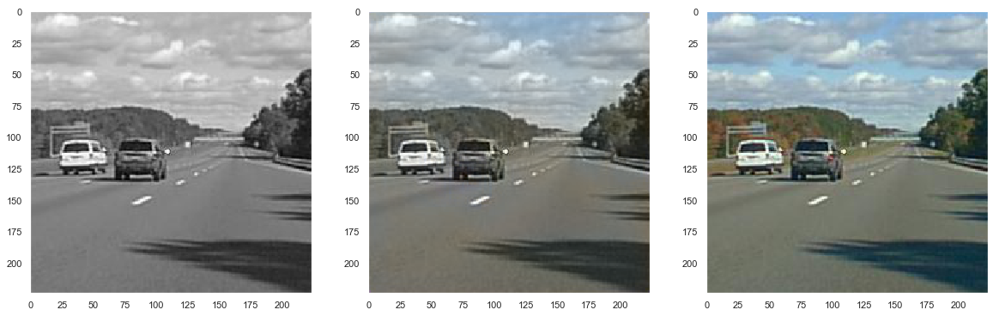

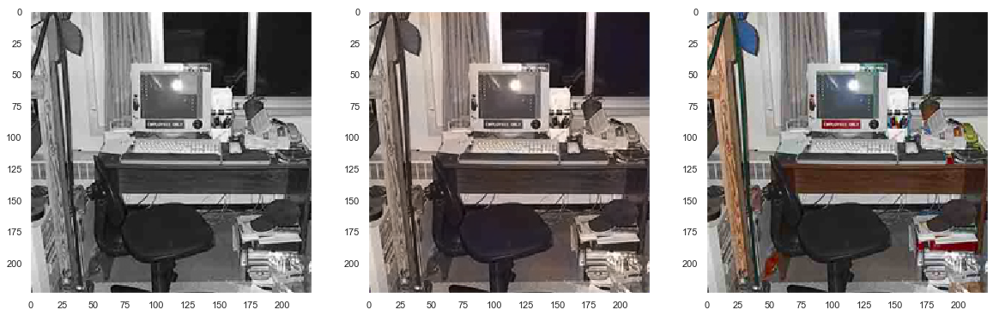

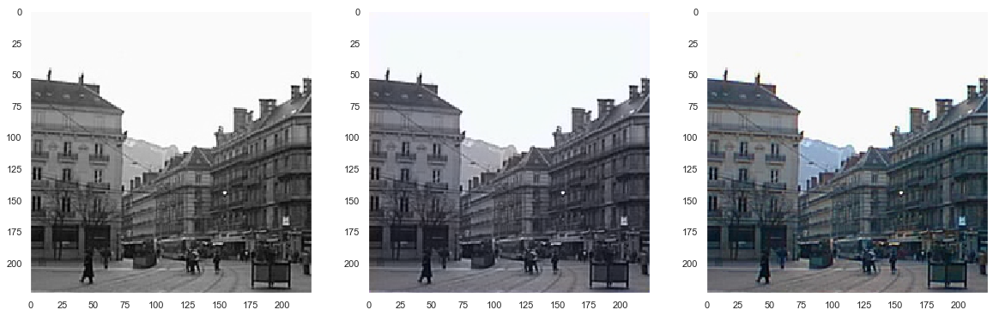

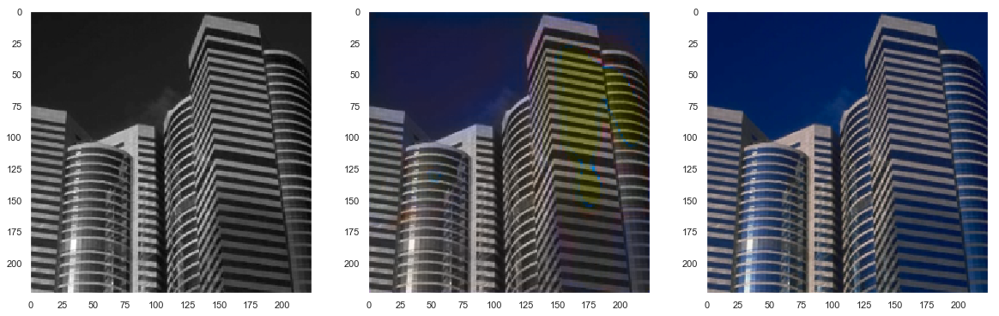

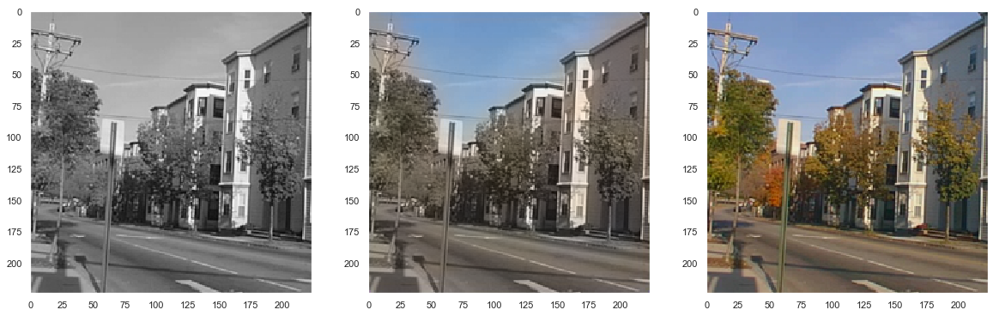

C:\Users\Cyril\Anaconda3\lib\site-packages\skimage\color\colorconv.py:997: UserWarning: Color data out of range: Z < 0 in 5 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


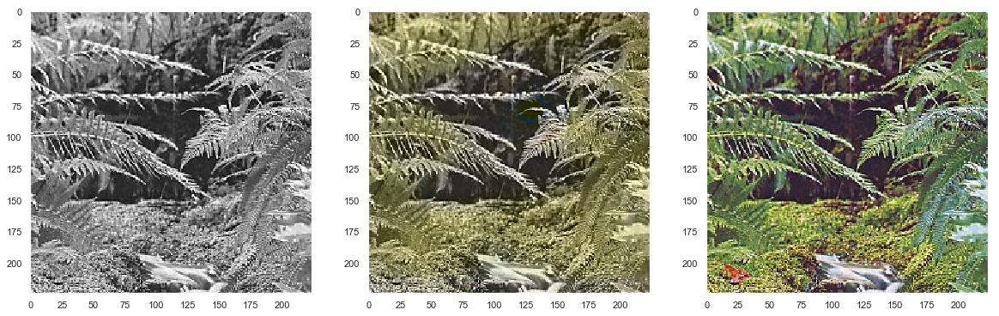

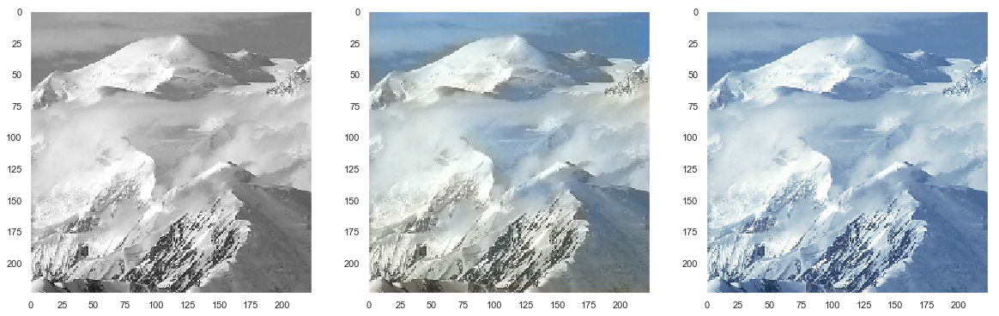

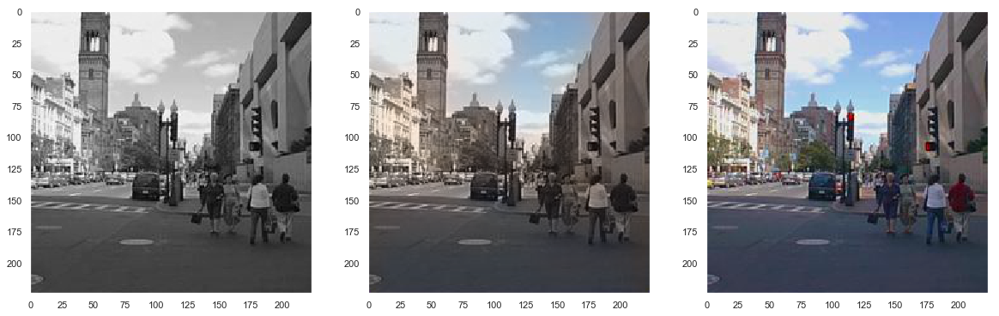

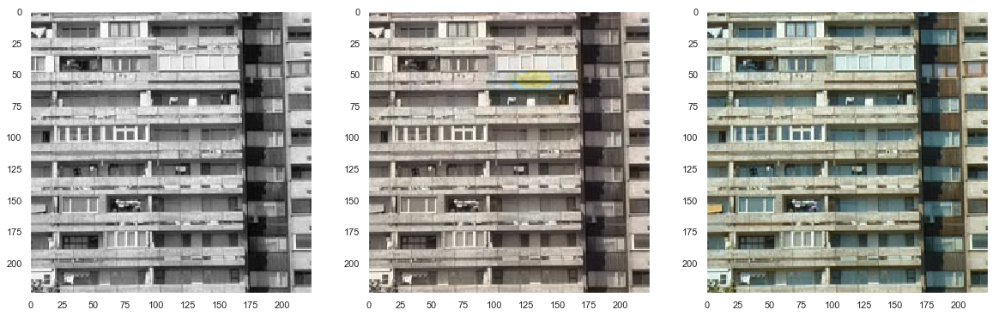

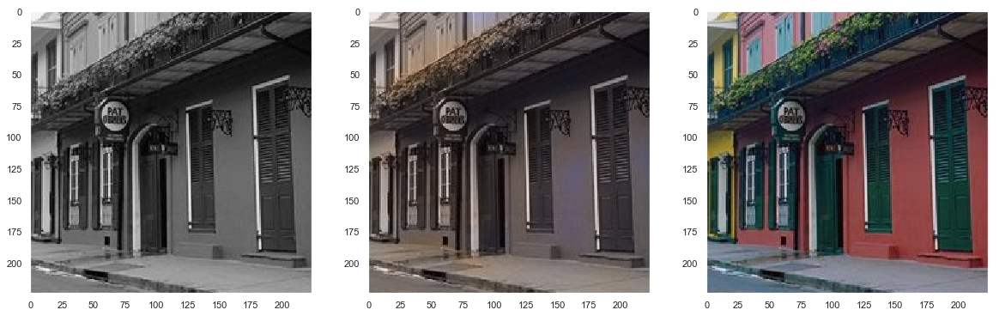

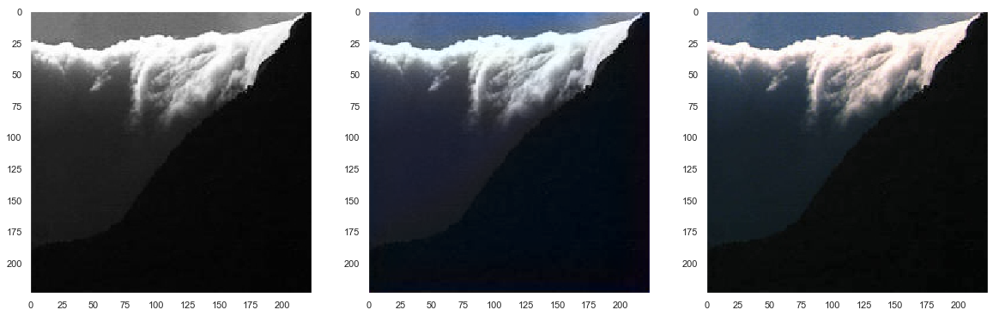

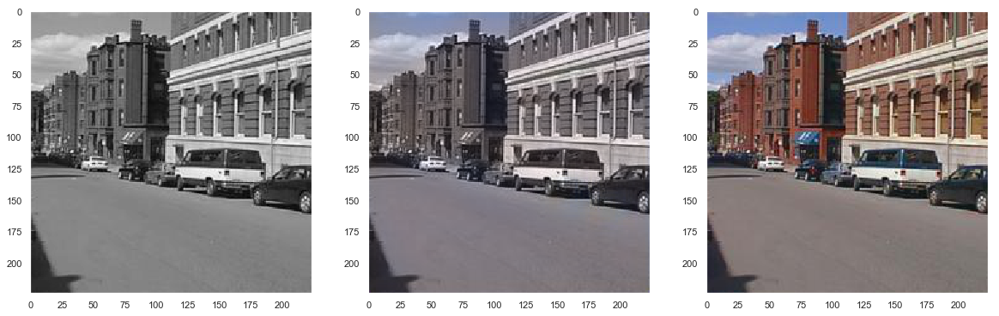

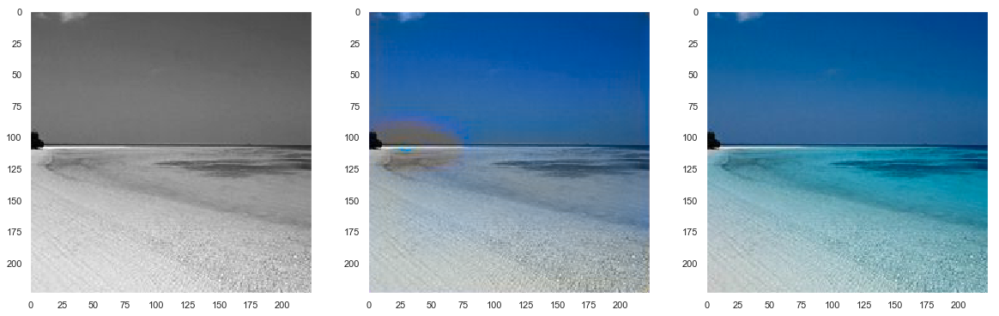

C:\Users\Cyril\Anaconda3\lib\site-packages\skimage\color\colorconv.py:997: UserWarning: Color data out of range: Z < 0 in 1 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


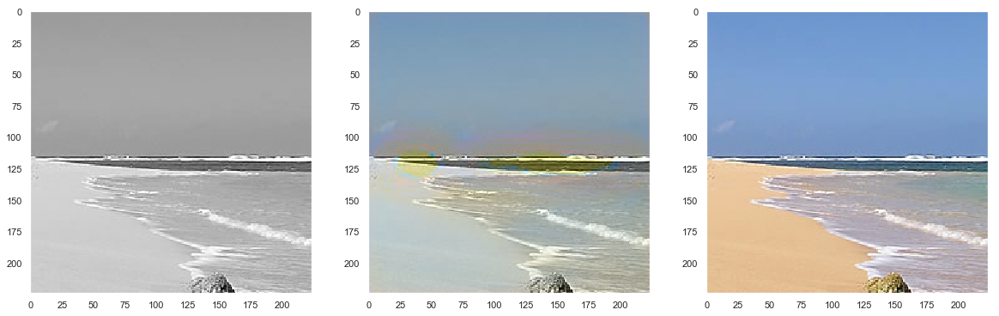

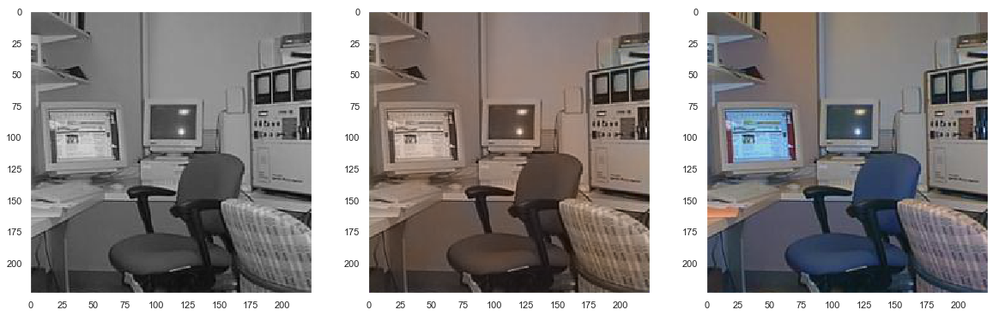

C:\Users\Cyril\Anaconda3\lib\site-packages\skimage\color\colorconv.py:997: UserWarning: Color data out of range: Z < 0 in 1 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


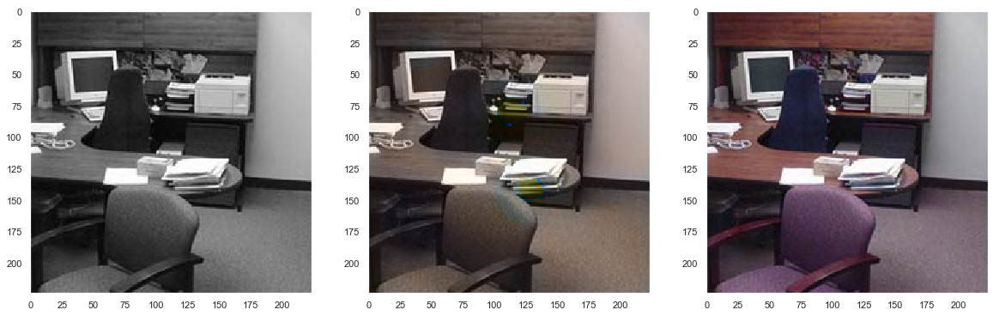

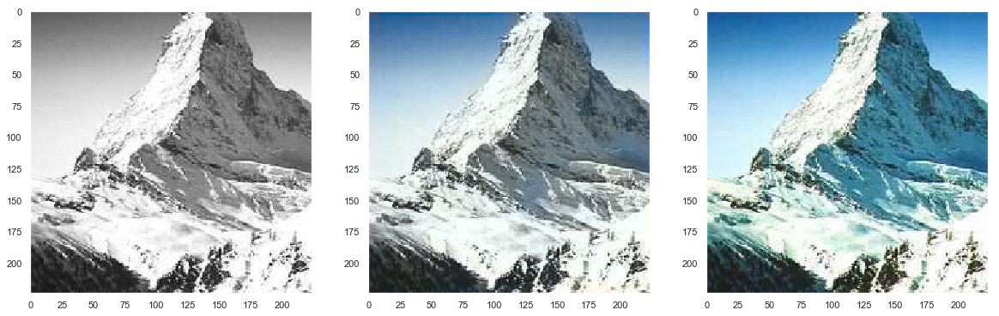

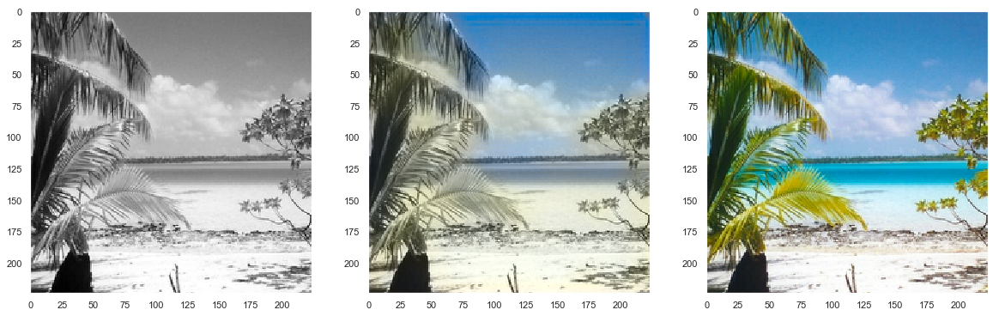

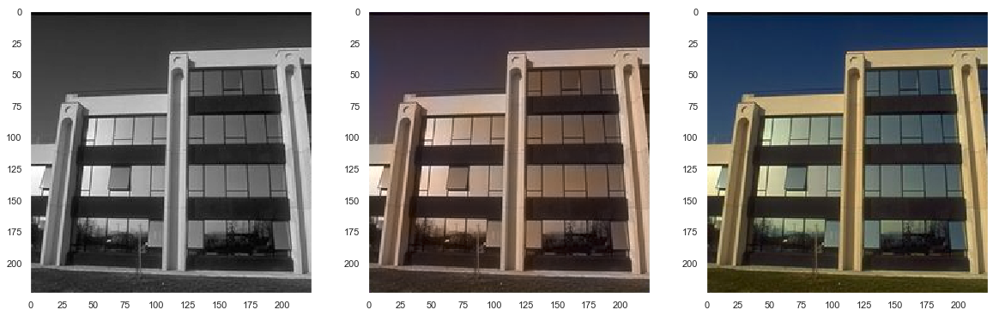

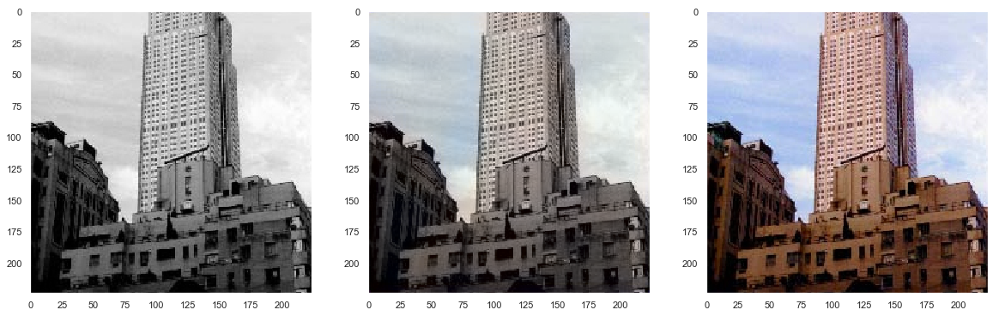

C:\Users\Cyril\Anaconda3\lib\site-packages\skimage\color\colorconv.py:997: UserWarning: Color data out of range: Z < 0 in 58 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


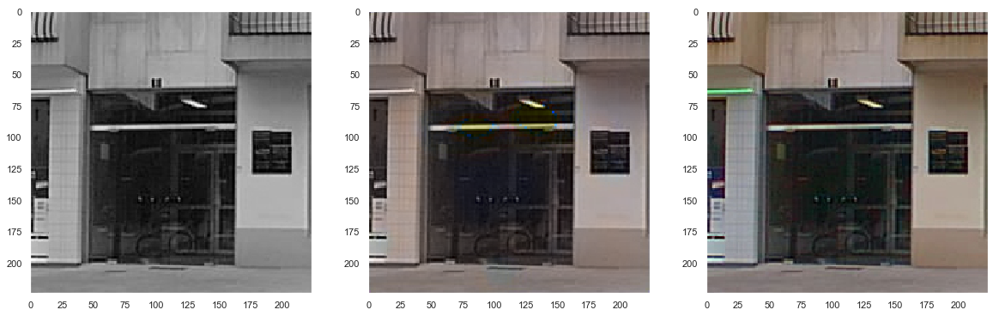

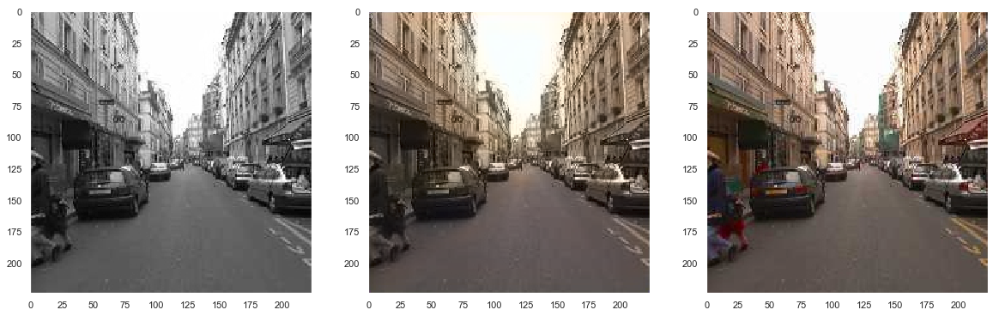

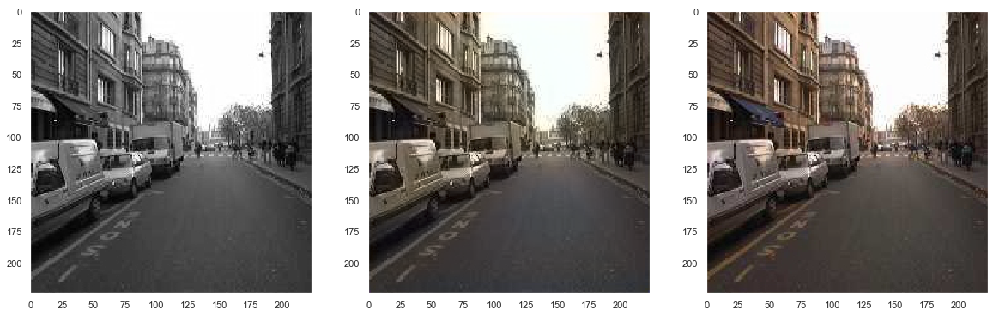

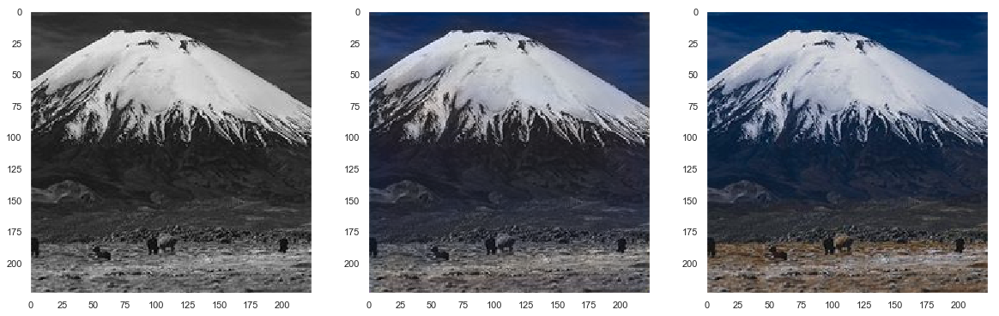

C:\Users\Cyril\Anaconda3\lib\site-packages\skimage\color\colorconv.py:997: UserWarning: Color data out of range: Z < 0 in 1 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


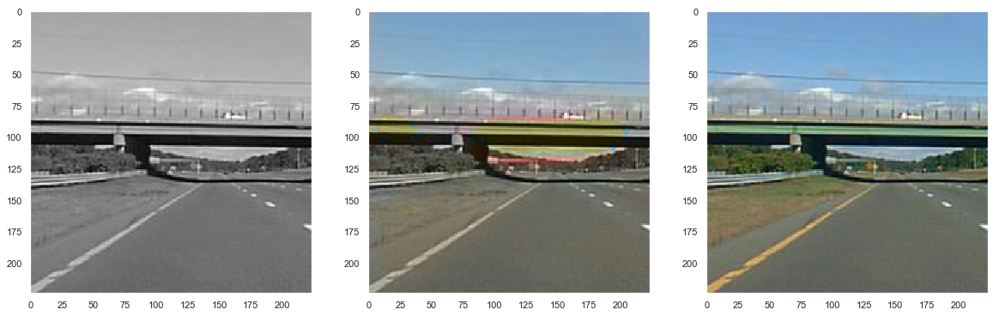

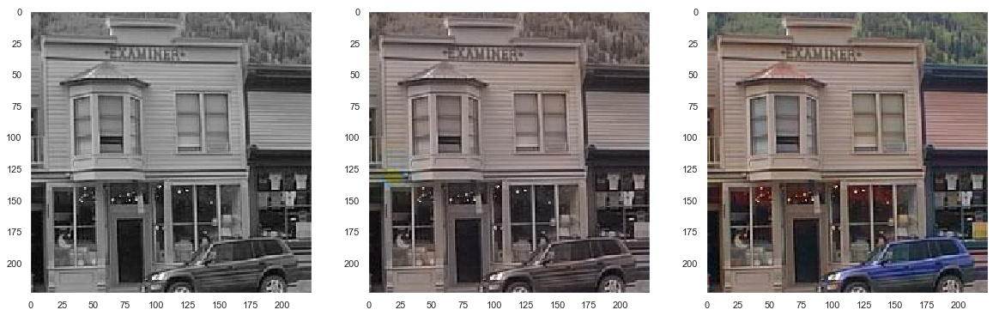

In [10]:
# i = random.randint(0,32)
for i in range(32):
    plt.figure(figsize=(20,20))
    
    plt.subplot(131)
    imshow(batch_imgs[i,:,:,0], cmap='gray')
    plt.grid(False)
    
    plt.subplot(132)
    imshow(color.lab2rgb(lab_image[i]))
    plt.grid(False)
    
    plt.subplot(133)
    imshow(color.lab2rgb(lab_image_true[i]))
    plt.grid(False)
    
    plt.show()